In [10]:
import healpy as h
from scipy.integrate import quad
import sys  ; sys.path.append("../../codes/")
from modules import local_eb_kernel as rk
import os
import timeit

%pylab notebook

Populating the interactive namespace from numpy and matplotlib


/Users/adityarotti/Library/Enthought/Canopy/edm/envs/User/lib/python2.7/site-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['f', 'rc']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [2]:
respath="../../figures/simulated/"
figpath=respath
!mkdir $figpath
datapath=respath + "generated_data/"
!mkdir $datapath

genplots=True

mkdir: ../../figures/simulated/: File exists
mkdir: ../../figures/simulated/generated_data/: File exists


In [3]:
nside=64 ; upnside=nside ; npix=h.nside2npix(upnside)
lmax=3*nside ; lmin=2
ell=arange(lmax+1)

odisc=min(180.,180.*(24./lmax))
print odisc

22.5


In [4]:
from matplotlib import rcParams,rc
params = {'backend': 'pdf',
          'savefig.dpi': 200,
          'axes.labelsize': 15,
          'text.fontsize': 15,
          'axes.linewidth' : 2,
          'lines.linewidth' : 2,
          'font.size': 15,
          'xtick.labelsize': 15,
          'ytick.major.pad': 6,
          'xtick.major.pad': 6,
          'ytick.labelsize': 15,
          'text.usetex': True,
          'font.family':'sans-serif',
          'font.sans-serif':'FreeSans'}
rc('text.latex', preamble='\usepackage{sfmath}')
rcParams.update(params)

/Users/adityarotti/Library/Enthought/Canopy/edm/envs/User/lib/python2.7/site-packages/matplotlib/__init__.py:913: UserWarning: text.fontsize is deprecated and replaced with font.size; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [5]:
cltemp=h.read_cl("../../data/planck_wp_highL_lensing_param.fits")
cl=[cltemp[0],cltemp[1],cltemp[2],cltemp[3]*0] # Reverse E and B spectra

random.seed(0) ; tqu=h.synfast(cl,nside,pol=True,new=True,verbose=False)

# Get teb maps from Healpix.
alm=h.map2alm(tqu,lmax=3*nside,pol=True) ; teb=h.alm2map(alm,upnside,pol=False,verbose=False)

# Get data power spectrum.
cld=h.alm2cl(alm)

# Get Q/U corresponding to E and B modes.
alm[2][:]=0.0 ; equ=h.alm2map(alm,nside=nside,pol=True,verbose=False)
alm=h.map2alm(tqu,lmax=3*nside,pol=True) ; alm[1][:]=0.0 ; bqu=h.alm2map(alm,nside=nside,pol=True,verbose=False)

fl=ones(3*nside+1,float) ; fl[:lmin+1]=0

In [6]:
y=rk.real_space_queb_kernels(nside,tmax=2.2*odisc,maxlmax=3*nside,sampling=2500)
y.calc_qu2eb_rad_kernel(lmax,lmin)
y.calc_qu2queb_rad_kernel(lmax,lmin)

In [7]:
y.setup_taper(2.2*odisc,2.) ; y.setup_fn_rad_ker()

<IPython.core.display.Javascript object>


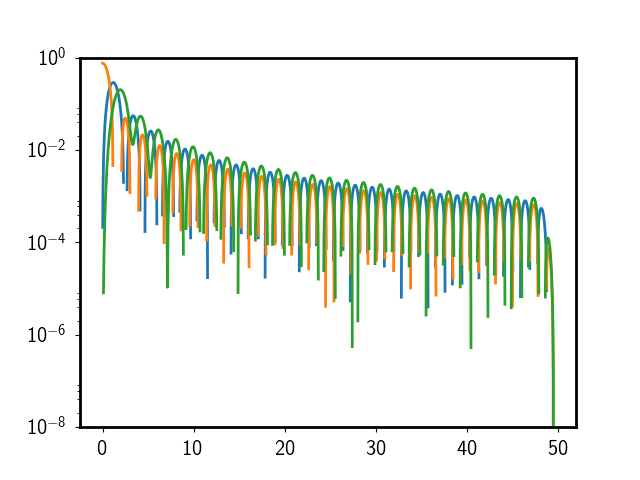

(1e-08, 1.0)

In [8]:
figure()
plot(y.theta*180/pi,y.fn_rad_ker(y.theta))
plot(y.theta*180/pi,y.fn_rad_ker_m2(y.theta))
plot(y.theta*180/pi,y.fn_rad_ker_p2(y.theta))
semilogy()
ylim(1e-8,1e0)

In [11]:
filenames=[]
filenames=append(filenames,datapath + "requ_2beta.fits")
filenames=append(filenames,datapath + "rbqu_2beta.fits")
filenames=append(filenames,datapath + "requ_1beta.fits")
filenames=append(filenames,datapath + "rbqu_1beta.fits")
filenames=append(filenames,datapath + "requ_0p5beta.fits")
filenames=append(filenames,datapath + "rbqu_0p5beta.fits")
filenames=append(filenames,datapath + "requ_0p25beta.fits")
filenames=append(filenames,datapath + "rbqu_0p25beta.fits")


fexist=True
for f in filenames:
    fexist=fexist and os.path.isfile(f)
fexist

False

In [12]:
if not(fexist):
    disc=2.*odisc ; y.setup_taper(disc,3.) ; y.setup_fn_rad_ker()
    equ0,bqu0=y.decompose_qu2_equ_bqu(tqu,discsize=disc)

    disc=1.*odisc ; y.setup_taper(disc,3.) ; y.setup_fn_rad_ker()
    equ1,bqu1=y.decompose_qu2_equ_bqu(tqu,discsize=disc)

    disc=0.5*odisc ; y.setup_taper(disc,3.) ; y.setup_fn_rad_ker()
    equ2,bqu2=y.decompose_qu2_equ_bqu(tqu,discsize=disc)

    disc=0.25*odisc ; y.setup_taper(disc,3.) ; y.setup_fn_rad_ker()
    equ3,bqu3=y.decompose_qu2_equ_bqu(tqu,discsize=disc)

    h.write_map(datapath + "requ_2beta.fits",equ0,overwrite=True)
    h.write_map(datapath + "rbqu_2beta.fits",bqu0,overwrite=True)
    h.write_map(datapath + "requ_1beta.fits",equ1,overwrite=True)
    h.write_map(datapath + "rbqu_1beta.fits",bqu1,overwrite=True)
    h.write_map(datapath + "requ_0p5beta.fits",equ2,overwrite=True)
    h.write_map(datapath + "rbqu_0p5beta.fits",bqu2,overwrite=True)
    h.write_map(datapath + "requ_0p25beta.fits",equ3,overwrite=True)
    h.write_map(datapath + "rbqu_0p25beta.fits",bqu3,overwrite=True)
else:
    h.read_map(datapath + "requ_2beta.fits",(0,1,2))
    h.read_map(datapath + "rbqu_2beta.fits",(0,1,2))
    h.read_map(datapath + "requ_1beta.fits",(0,1,2))
    h.read_map(datapath + "rbqu_1beta.fits",(0,1,2))
    h.read_map(datapath + "requ_0p5beta.fits",(0,1,2))
    h.read_map(datapath + "rbqu_0p5beta.fits",(0,1,2))
    h.read_map(datapath + "requ_0p25beta.fits",(0,1,2))
    h.read_map(datapath + "rbqu_0p25beta.fits",(0,1,2))

In [14]:
cle0=h.alm2cl(h.map2alm(equ0,lmax=3*nside))
cle1=h.alm2cl(h.map2alm(equ1,lmax=3*nside))
cle2=h.alm2cl(h.map2alm(equ2,lmax=3*nside))
cle3=h.alm2cl(h.map2alm(equ3,lmax=3*nside))

clb0=h.alm2cl(h.map2alm(bqu0,lmax=3*nside))
clb1=h.alm2cl(h.map2alm(bqu1,lmax=3*nside))
clb2=h.alm2cl(h.map2alm(bqu2,lmax=3*nside))
clb3=h.alm2cl(h.map2alm(bqu3,lmax=3*nside))

fll=ell*(ell+1)/(2.*pi)

<IPython.core.display.Javascript object>


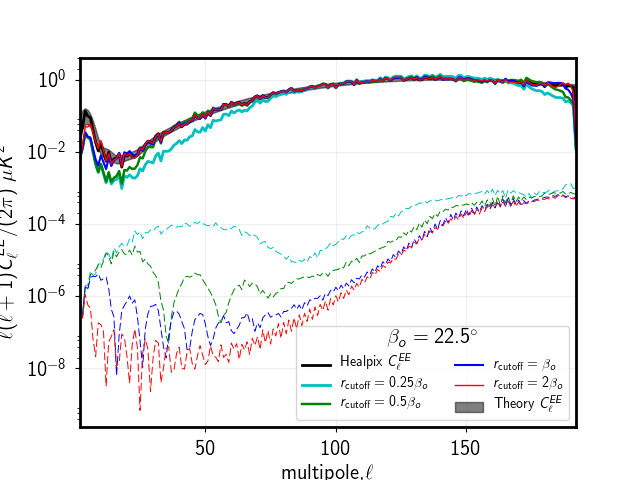

<IPython.core.display.Javascript object>


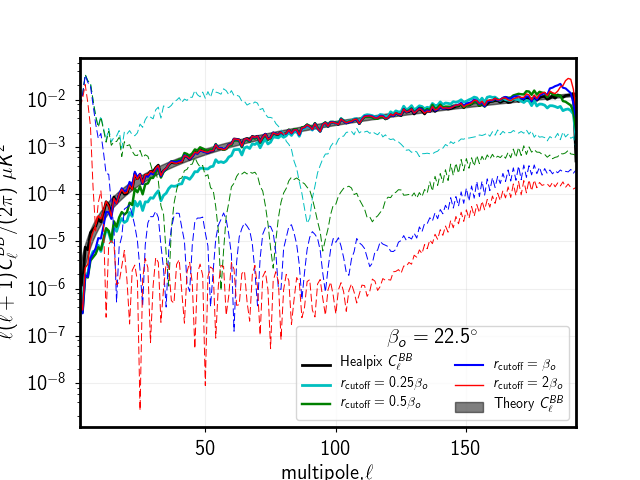

In [20]:
figure()
std=sqrt(2./(2.*ell+1))*cl[1][:lmax+1]
fill_between(ell,fll*(cl[1][:lmax+1]-std),fll*(cl[1][:lmax+1]+std),color="k",alpha=0.5,label=r"Theory $C^{EE}_{\ell}$")
plot(ell,fll*cld[1],"k-",label=r"Healpix $C_{\ell}^{EE}$")
plot(ell,fll*cle3[1],"c-",lw=2,label=r"$r_{\rm cutoff} = 0.25\beta_{o}$")
plot(ell,fll*cle2[1],"g-",lw=1.75,label=r"$r_{\rm cutoff} = 0.5\beta_{o}$")
plot(ell,fll*cle1[1],"b-",lw=1.5,label=r"$r_{\rm cutoff} = \beta_{o}$")
plot(ell,fll*cle0[1],"r-",lw=1,label=r"$r_{\rm cutoff} = 2\beta_{o}$")
plot(ell,fll*cle3[2],"c--",lw=0.7)
plot(ell,fll*cle2[2],"g--",lw=0.7)
plot(ell,fll*cle1[2],"b--",lw=0.7)
plot(ell,fll*cle0[2],"r--",lw=0.7)
semilogy()
xlim(2,3*nside)
xlabel("multipole,$\ell$")
ylabel("$\ell(\ell+1)C^{EE}_{\ell}/(2\pi) ~ \mu K^2$")
legend(loc=0,fontsize=10,ncol=2,title=r"$\beta_o=" + str(odisc) + "^{\circ}$")
grid(alpha=0.2,linestyle="solid")
if genplots:
    savefig(figpath + "equ-spectra-radial-cutoff.pdf",dpi=300,bbox_inches="tight")

figure()
std=sqrt(2./(2.*ell+1))*cl[2][:lmax+1]
fill_between(ell,fll*(cl[2][:lmax+1]-std),fll*(cl[2][:lmax+1]+std),color="k",alpha=0.5,label=r"Theory $C^{BB}_{\ell}$")
#plot(ell,fll*cl[2][:lmax+1],"k-",lw=5,label=r"Theory $C^{BB}_{\ell}$",alpha=0.4)
plot(ell,fll*cld[2],"k-",label=r"Healpix $C_{\ell}^{BB}$")
plot(ell,fll*clb3[2],"c-",lw=2,label=r"$r_{\rm cutoff} = 0.25\beta_{o}$")
plot(ell,fll*clb2[2],"g-",lw=1.75,label=r"$r_{\rm cutoff} = 0.5\beta_{o}$")
plot(ell,fll*clb1[2],"b-",lw=1.5,label=r"$r_{\rm cutoff} = \beta_{o}$")
plot(ell,fll*clb0[2],"r-",lw=1,label=r"$r_{\rm cutoff} = 2\beta_{o}$")
plot(ell,fll*clb3[1],"c--",lw=0.7)
plot(ell,fll*clb2[1],"g--",lw=0.7)
plot(ell,fll*clb1[1],"b--",lw=0.7)
plot(ell,fll*clb0[1],"r--",lw=0.7)
semilogy()
xlim(2,3*nside)
xlabel("multipole,$\ell$")
ylabel("$\ell(\ell+1)C^{BB}_{\ell}/(2\pi) ~ \mu K^2$")
legend(loc=0,fontsize=10,ncol=2,title=r"$\beta_o=" + str(odisc) + "^{\circ}$")
grid(alpha=0.2,linestyle="solid")
if genplots:
    savefig(figpath + "bqu-spectra-radial-cutoff.pdf",dpi=300,bbox_inches="tight")

<IPython.core.display.Javascript object>


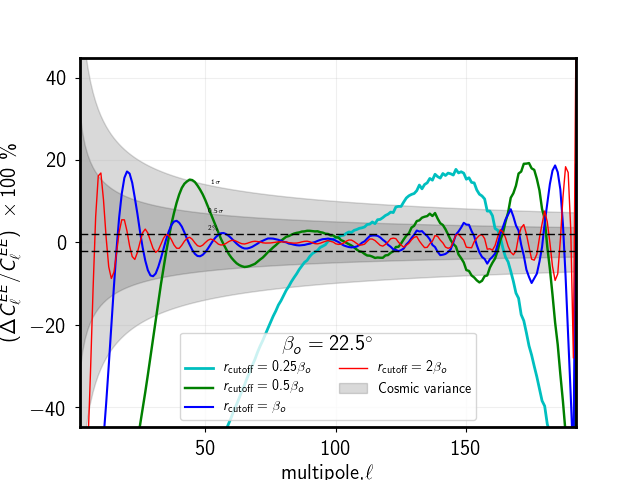

/Users/adityarotti/Library/Enthought/Canopy/edm/envs/User/lib/python2.7/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in divide
  app.launch_new_instance()
/Users/adityarotti/Library/Enthought/Canopy/edm/envs/User/lib/python2.7/site-packages/ipykernel/__main__.py:4: RuntimeWarning: invalid value encountered in divide
/Users/adityarotti/Library/Enthought/Canopy/edm/envs/User/lib/python2.7/site-packages/ipykernel/__main__.py:5: RuntimeWarning: invalid value encountered in divide
/Users/adityarotti/Library/Enthought/Canopy/edm/envs/User/lib/python2.7/site-packages/ipykernel/__main__.py:6: RuntimeWarning: invalid value encountered in divide


In [18]:
figure()
std=cld[1]/100.
plot(ell,(cle3[1]-cld[1])/std,"c-",lw=2,label=r"$r_{\rm cutoff} = 0.25\beta_{o}$")
plot(ell,(cle2[1]-cld[1])/std,"g-",lw=1.75,label=r"$r_{\rm cutoff} = 0.5\beta_{o}$")
plot(ell,(cle1[1]-cld[1])/std,"b-",lw=1.5,label=r"$r_{\rm cutoff} = \beta_{o}$")
plot(ell,(cle0[1]-cld[1])/std,"r-",lw=1,label=r"$r_{\rm cutoff} = 2\beta_{o}$")
fill_between(ell,-sqrt(2./(2.*ell+1))*100,sqrt(2./(2.*ell+1))*100,color="black",alpha=0.15,label="Cosmic variance")
fill_between(ell,-0.5*sqrt(2./(2.*ell+1))*100,0.5*sqrt(2./(2.*ell+1))*100,color="black",alpha=0.15,label="")
text(52,14.2,r"$1 \sigma$",fontsize=5)
text(51,7.2,r"$0.5 \sigma$",fontsize=5)
text(51,2.8,r"$2 \%$",fontsize=5)
ylim(-45,45)
xlim(2,3*nside)
xlabel("multipole,$\ell$")
ylabel(r"$(\Delta C^{EE}_{\ell}/C^{EE}_{\ell}) ~\times 100 ~\%$")
legend(loc="lower center",fontsize=10,ncol=2,title=r"$\beta_o=" + str(odisc) + "^{\circ}$")
axhline(-2,0,200,linestyle="dashed",color="k",alpha=1.,lw=1)
axhline(2,0,200,linestyle="dashed",color="k",alpha=1.,lw=1)
grid(alpha=0.2,linestyle="solid")
if genplots:
    savefig(figpath + "relative-percentage-err-equ-e-spectrum-radial-cutoff.pdf",dpi=300,bbox_inches="tight")

<IPython.core.display.Javascript object>


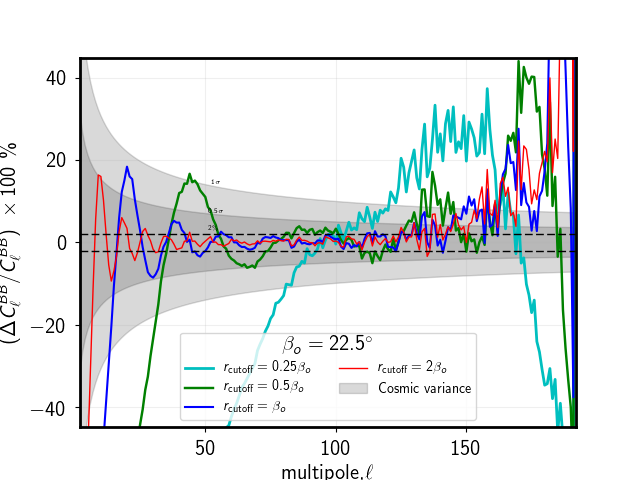

/Users/adityarotti/Library/Enthought/Canopy/edm/envs/User/lib/python2.7/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in divide
  app.launch_new_instance()
/Users/adityarotti/Library/Enthought/Canopy/edm/envs/User/lib/python2.7/site-packages/ipykernel/__main__.py:4: RuntimeWarning: invalid value encountered in divide
/Users/adityarotti/Library/Enthought/Canopy/edm/envs/User/lib/python2.7/site-packages/ipykernel/__main__.py:5: RuntimeWarning: invalid value encountered in divide
/Users/adityarotti/Library/Enthought/Canopy/edm/envs/User/lib/python2.7/site-packages/ipykernel/__main__.py:6: RuntimeWarning: invalid value encountered in divide


In [19]:
figure()
std=cld[2]/100.
plot(ell,(clb3[2]-cld[2])/std,"c-",lw=2,label=r"$r_{\rm cutoff} = 0.25\beta_{o}$")
plot(ell,(clb2[2]-cld[2])/std,"g-",lw=1.75,label=r"$r_{\rm cutoff} = 0.5\beta_{o}$")
plot(ell,(clb1[2]-cld[2])/std,"b-",lw=1.5,label=r"$r_{\rm cutoff} = \beta_{o}$")
plot(ell,(clb0[2]-cld[2])/std,"r-",lw=1,label=r"$r_{\rm cutoff} = 2\beta_{o}$")
fill_between(ell,-sqrt(2./(2.*ell+1))*100,sqrt(2./(2.*ell+1))*100,color="black",alpha=0.15,label="Cosmic variance")
fill_between(ell,-0.5*sqrt(2./(2.*ell+1))*100,0.5*sqrt(2./(2.*ell+1))*100,color="black",alpha=0.15,label="")
text(52,14.2,r"$1 \sigma$",fontsize=5)
text(51,7.2,r"$0.5 \sigma$",fontsize=5)
text(51,2.8,r"$2 \%$",fontsize=5)
ylim(-45,45)
xlim(2,3*nside)
xlabel("multipole,$\ell$")
ylabel(r"$(\Delta C^{BB}_{\ell}/C^{BB}_{\ell}) ~\times 100 ~\%$")
legend(loc="lower center",fontsize=10,ncol=2,title=r"$\beta_o=" + str(odisc) + "^{\circ}$")
axhline(-2,0,200,linestyle="dashed",color="k",alpha=1,lw=1)
axhline(2,0,200,linestyle="dashed",color="k",alpha=1,lw=1)
grid(alpha=0.2,linestyle="solid")
if genplots:
    savefig(figpath + "relative-percentage-err-bqu-b-spectrum-radial-cutoff.pdf",dpi=300,bbox_inches="tight")

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


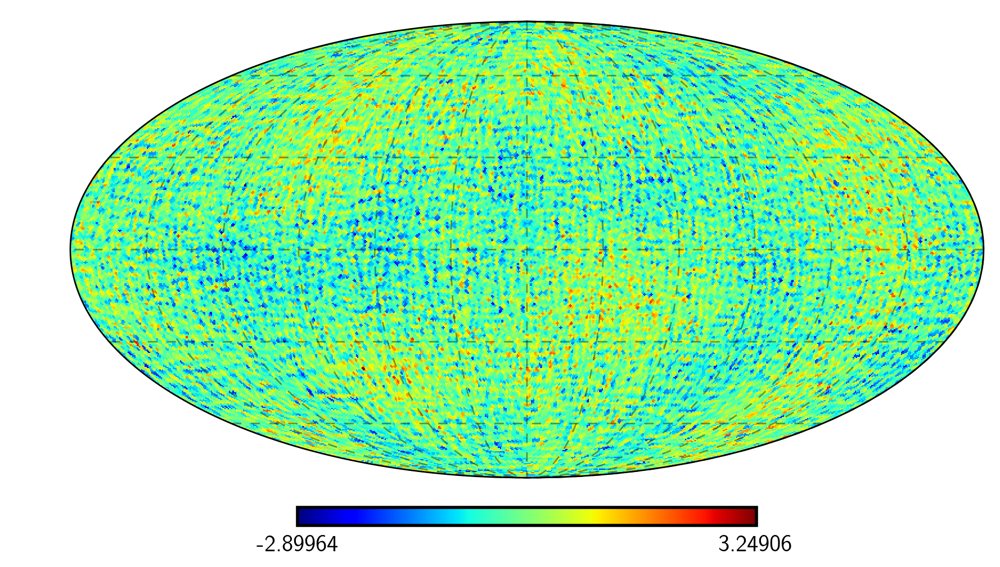

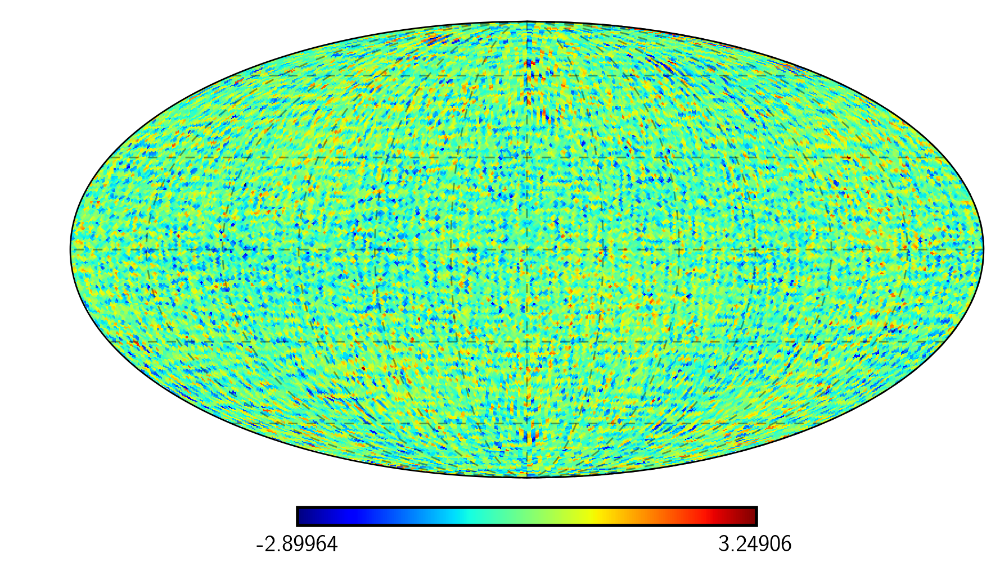

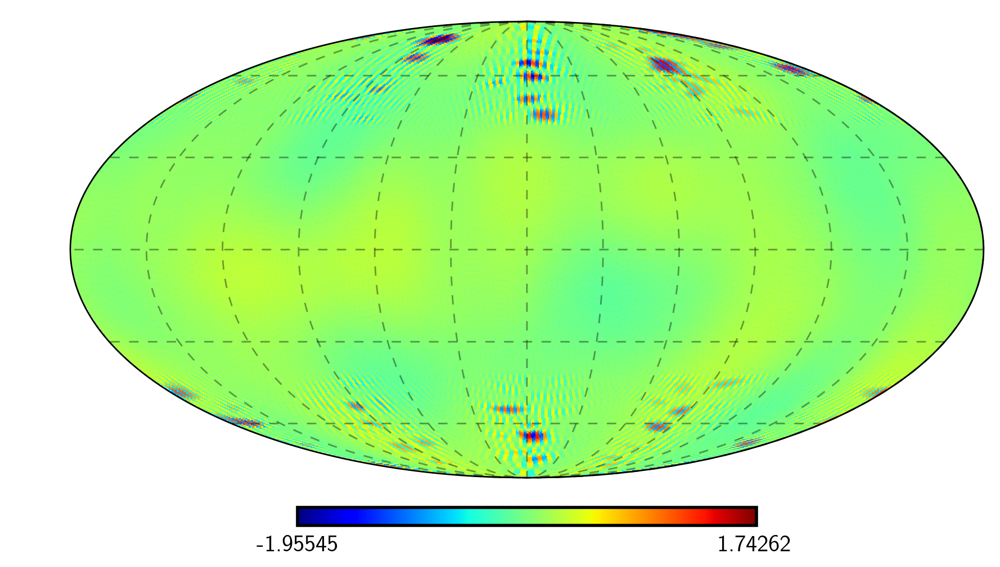

In [82]:
vmin=min(equ[1]) ; vmax=max(equ[1])

h.mollview(equ[1],min=vmin,max=vmax,title="") ; h.graticule(linestyle="dashed",alpha=0.4)
if genplots:
    savefig(figpath + "e-qmap-healpix.pdf",dpi=300,bbox_inches="tight")

h.mollview(equ1[1],min=vmin,max=vmax,title="") ; h.graticule(linestyle="dashed",alpha=0.4)
if genplots:
    savefig(figpath + "e-qmap-2beta.pdf",dpi=300,bbox_inches="tight")
    
h.mollview(equ1[1]-equ[1],title="") ; h.graticule(linestyle="dashed",alpha=0.4)
if genplots:
    savefig(figpath + "e-qmap-diff.pdf",dpi=300,bbox_inches="tight")

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


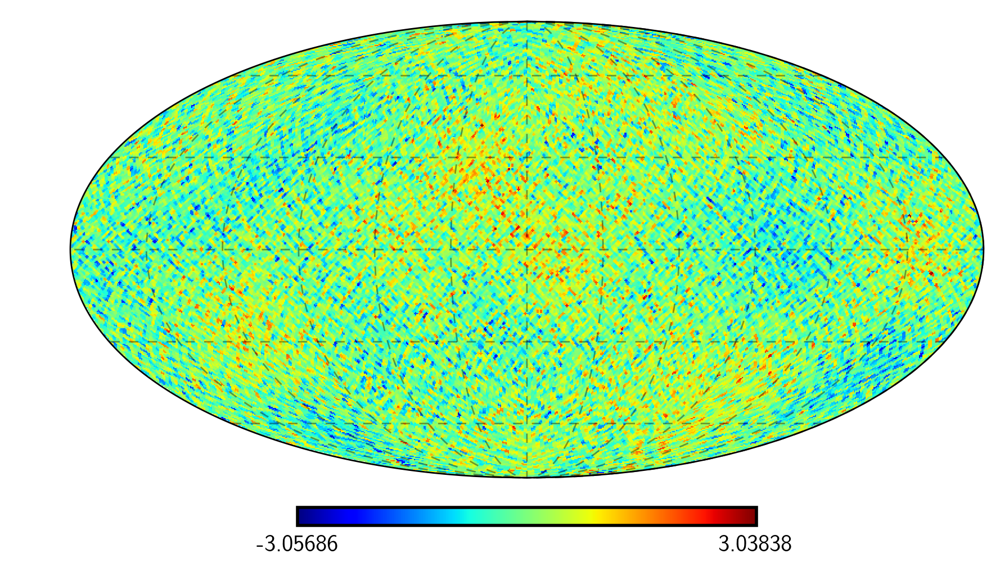

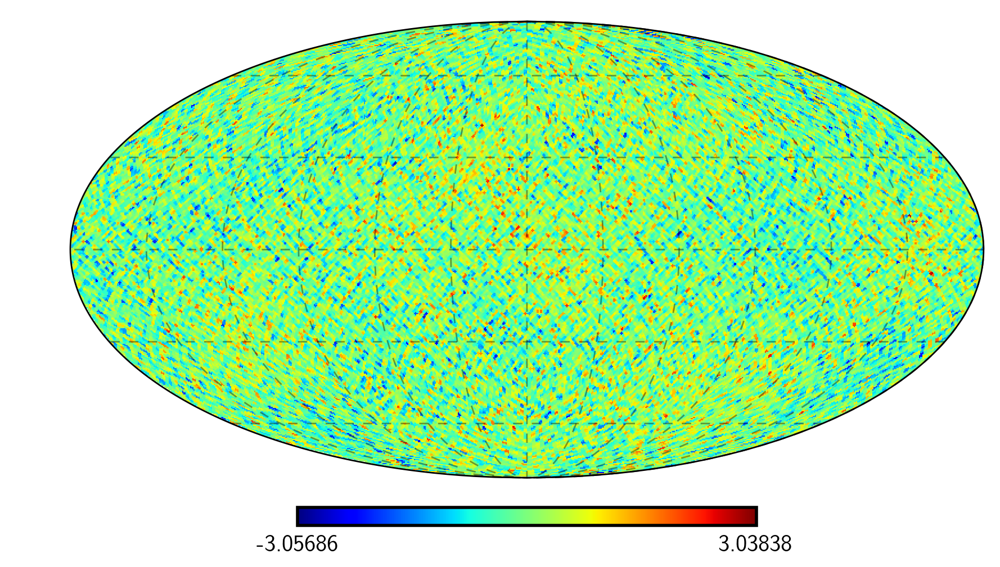

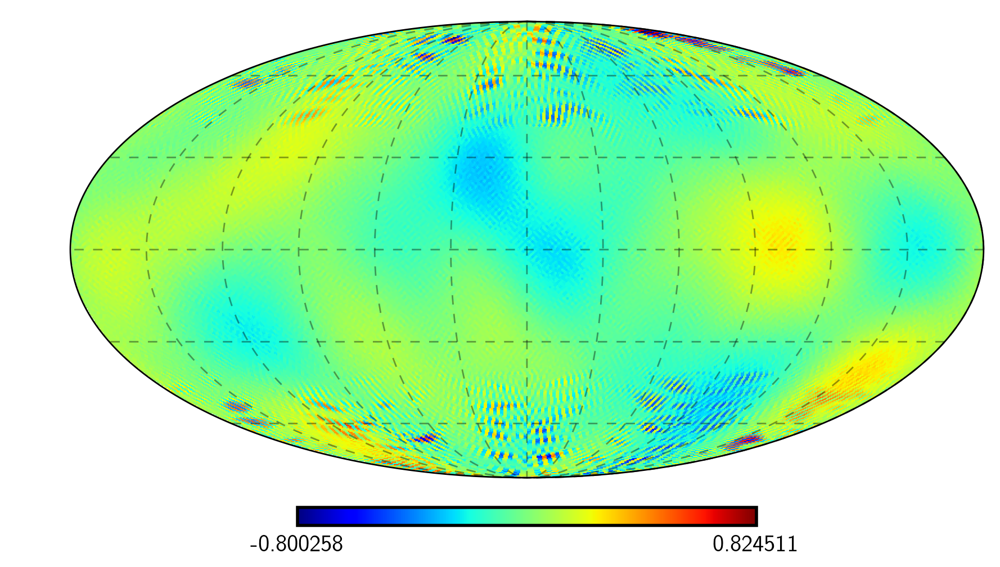

In [83]:
vmin=min(equ[2]) ; vmax=max(equ[2])

h.mollview(equ[2],min=vmin,max=vmax,title="") ; h.graticule(linestyle="dashed",alpha=0.4)
if genplots:
    savefig(figpath + "e-umap-healpix.pdf",dpi=300,bbox_inches="tight")

h.mollview(equ1[2],min=vmin,max=vmax,title="") ; h.graticule(linestyle="dashed",alpha=0.4)
if genplots:
    savefig(figpath + "e-umap-2beta.pdf",dpi=300,bbox_inches="tight")
    
h.mollview(equ1[2]-equ[2],title="") ; h.graticule(linestyle="dashed",alpha=0.4)
if genplots:
    savefig(figpath + "e-umap-diff.pdf",dpi=300,bbox_inches="tight")

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


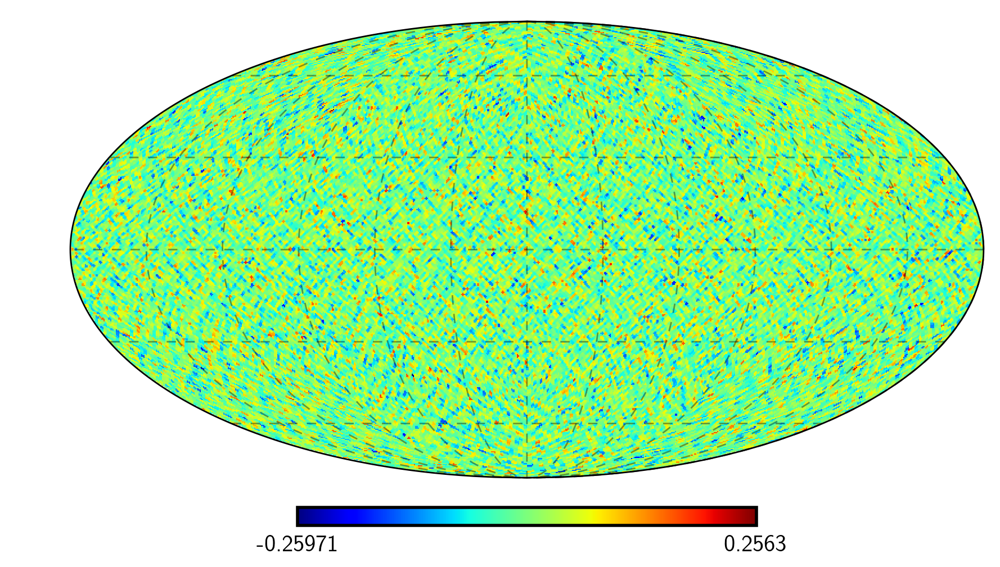

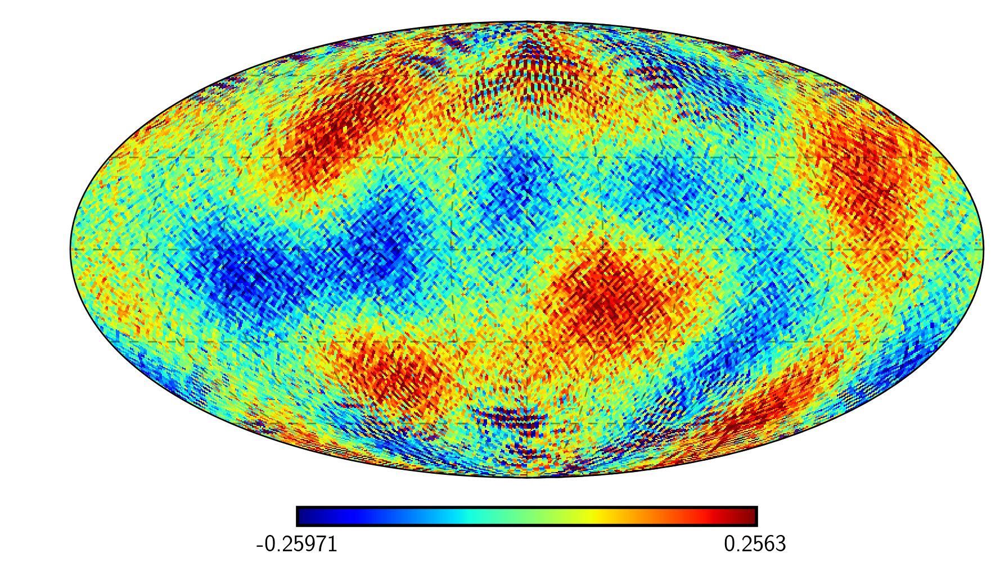

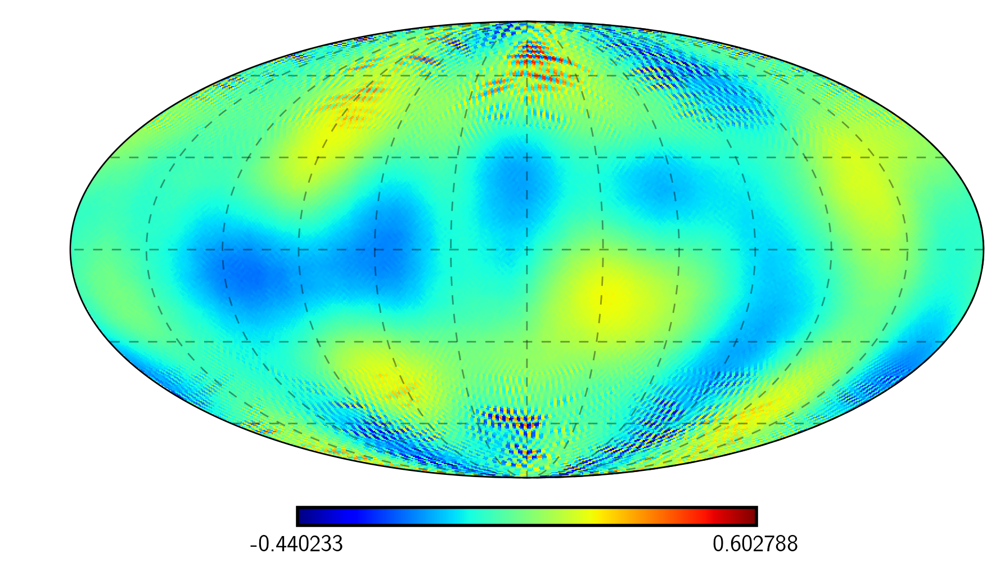

In [84]:
vmin=min(bqu[1]) ; vmax=max(bqu[1])

h.mollview(bqu[1],min=vmin,max=vmax,title="") ; h.graticule(linestyle="dashed",alpha=0.4)
if genplots:
    savefig(figpath + "b-qmap-healpix.pdf",dpi=300,bbox_inches="tight")

h.mollview(bqu1[1],min=vmin,max=vmax,title="") ; h.graticule(linestyle="dashed",alpha=0.4)
if genplots:
    savefig(figpath + "b-qmap-2beta.pdf",dpi=300,bbox_inches="tight")
    
h.mollview(bqu1[1]-bqu[1],title="") ; h.graticule(linestyle="dashed",alpha=0.4)
if genplots:
    savefig(figpath + "b-qmap-diff.pdf",dpi=300,bbox_inches="tight")

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


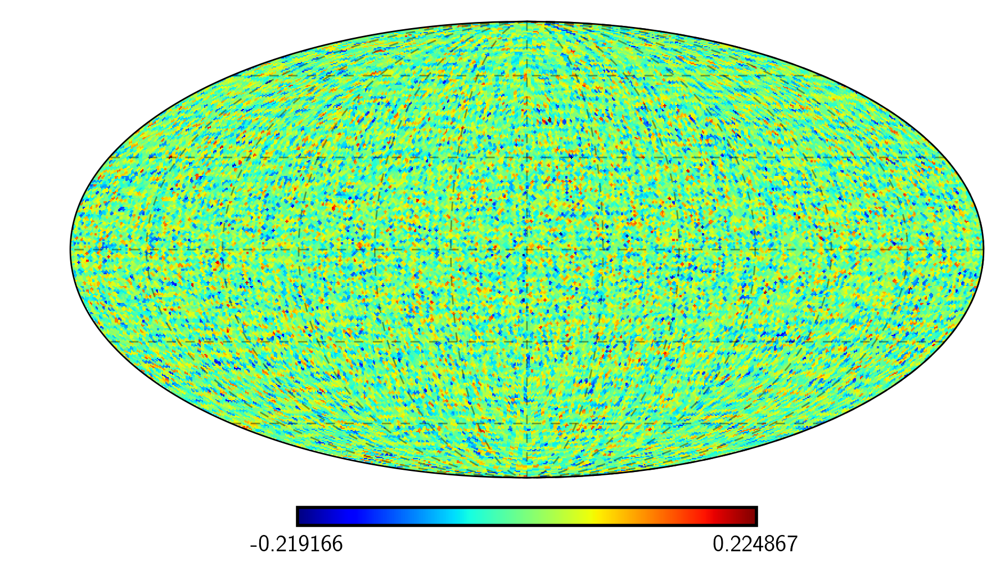

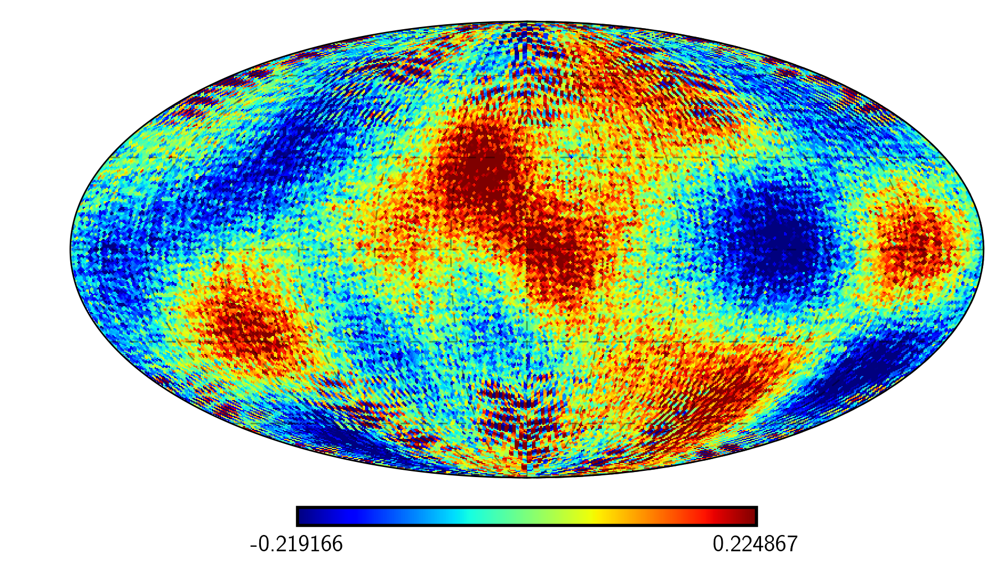

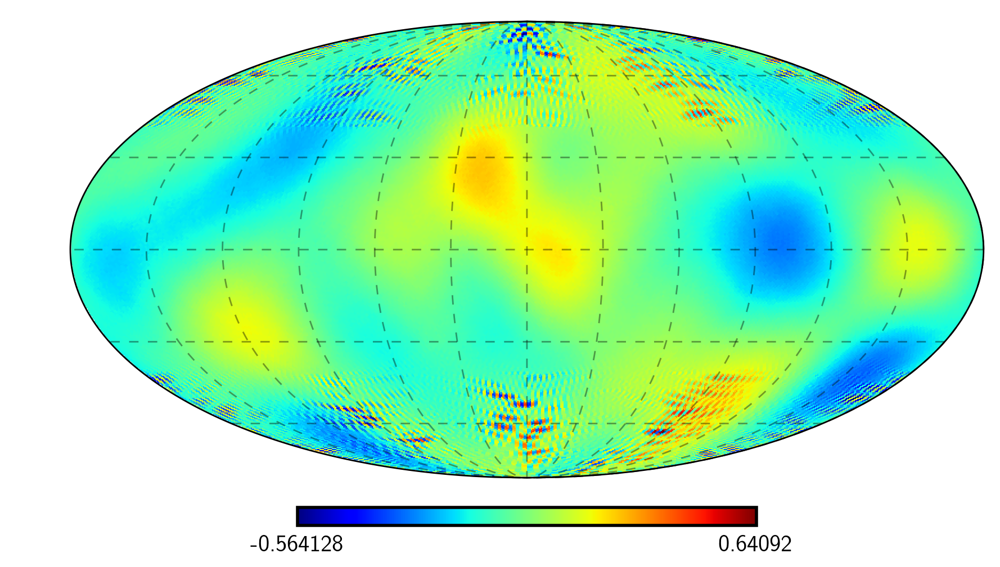

In [85]:
vmin=min(bqu[2]) ; vmax=max(bqu[2])

h.mollview(bqu[2],min=vmin,max=vmax,title="") ; h.graticule(linestyle="dashed",alpha=0.4)
if genplots:
    savefig(figpath + "b-umap-healpix.pdf",dpi=300,bbox_inches="tight")

h.mollview(bqu1[2],min=vmin,max=vmax,title="") ; h.graticule(linestyle="dashed",alpha=0.4)
if genplots:
    savefig(figpath + "b-umap-2beta.pdf",dpi=300,bbox_inches="tight")
    
h.mollview(bqu1[2]-bqu[2],title="") ; h.graticule(linestyle="dashed",alpha=0.4)
if genplots:
    savefig(figpath + "b-umap-diff.pdf",dpi=300,bbox_inches="tight")